## Model to identify the potential customers who have a higher probability to churn

**DOMAIN:** Telecom<br>
**CONTEXT:** A telecom company wants to use their historical customer data to predict behaviour to retain customers. You can
analyse all relevant customer data and develop focused customer retention programs.<br>
**DATA DESCRIPTION:** Each row represents a customer, each column contains customer’s attributes described on the column
 Metadata. The data set includes information about:
- Customers who left within the last month – the column is called Churn
- Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device
protection, tech support, and streaming TV and movies
- Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly
charges, and total charges
- Demographic info about customers – gender, age range, and if they have partners and dependents

**PROJECT OBJECTIVE:** Build a model that will help to identify the potential customers who have a higher probability to churn.
This help the company to understand the pinpoints and patterns of customer churn and will increase the focus on strategising
customer retention.

# 1. Import and warehouse data:

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import time

#for mysql connection
import mysql.connector
from mysql.connector import errorcode

#for visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
%matplotlib inline

#color change for print statement etc.
from colorama import Fore

#to ignore warning
import warnings as wn
wn.filterwarnings('ignore')

#model
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.ensemble import AdaBoostClassifier 
from sklearn.ensemble import BaggingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

#Metrics
from sklearn.metrics import f1_score, recall_score, confusion_matrix,classification_report
from sklearn.metrics import precision_recall_curve, precision_score, accuracy_score
from sklearn.model_selection import cross_validate

from sklearn.model_selection import learning_curve
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import GridSearchCV


### i.Import all the given datasets from MYSQL server.

In [2]:
##Establishing the connection with mysql database
print("Establishing MySQL Server Connection...\n")

try:
    mydb = mysql.connector.connect(
       host = "localhost",           #server running in same system..if differnt system provide the ip and port
       user = "root",                #User name
       database = 'telecome_proj',   #database_name: ("telecome_proj" created for this project).
       password = 'root@123')        #Password: Database password
    


    #check if the connection status
    if(mydb.is_connected()):
        print("Connection to MySQL server is success...")
    else:
        print("Connection to MySQL server faild !!")
        
except mysql.connector.Error as err:
    print("Connection to MySQL server faild !!: {}".format(err))


Establishing MySQL Server Connection...

Connection to MySQL server is success...


### Three table created in mysql to load the data given for this project:

### Table Metadata:
- **Table for dataset TelcomCustomer-Churn**

create table if not exists telecome_dataset1(customerID    varchar(100),
                              gender        varchar(100),
                              SeniorCitizen numeric(3),
                              Partner       varchar(100),
                              Dependents    varchar(100),
                              tenure        numeric(3),
                              PhoneService     varchar(100),
                              MultipleLines    varchar(100),
                              InternetService  varchar(100),
                              OnlineSecurity   varchar(100),
                              OnlineBackup     varchar(100),
                              DeviceProtection varchar(100),
                              TechSupport      varchar(100),
                              StreamingTV      varchar(100),
							  StreamingMovies  varchar(100),
                              Contract         varchar(100),
                              PaperlessBilling varchar(100),
                              PaymentMethod    varchar(100),
                              MonthlyCharges   float4(20),
                              TotalCharges     varchar(100),
                              Churn            varchar(100)
							);

- **table for TelcomCustomer-Churn_1**   

create table if not exists telecome_dataset2(customerID    varchar(100),
                              gender        varchar(100),
                              SeniorCitizen numeric(3),
                              Partner       varchar(100),
                              Dependents    varchar(100),
                              tenure        numeric(3),
                              PhoneService     varchar(100),
                              MultipleLines    varchar(100),
                              InternetService  varchar(100),
                              OnlineSecurity   varchar(100)
							);

- **Table for dataset TelcomCustomer-Churn_2**

create table if not exists telecome_dataset3(OnlineBackup     varchar(100),
                              DeviceProtection varchar(100),
                              TechSupport      varchar(100),
                              StreamingTV      varchar(100),
							  StreamingMovies  varchar(100),
                              Contract         varchar(100),
                              PaperlessBilling varchar(100),
                              PaymentMethod    varchar(100),
                              MonthlyCharges   float4(20),
                              TotalCharges     varchar(100),
                              Churn            varchar(100)
							); 

In [3]:
#reading data from MySQL db user and loading into data frame
mycursor = mydb.cursor()
telecome_dataset1 = "select * from telecome_dataset1"
telecome_dataset2 = "select * from telecome_dataset2"
telecome_dataset3 = "select * from telecome_dataset3"

try:
    #Execute the query and fetch the data from mysql database
    mycursor.execute(telecome_dataset1)
    result_dataset1 = [dict((mycursor.description[i][0], value) for i, value in enumerate(row)) for row in mycursor.fetchall()]
    
    mycursor.execute(telecome_dataset2)  
    result_dataset2 = [dict((mycursor.description[i][0], value) for i, value in enumerate(row)) for row in mycursor.fetchall()]

    mycursor.execute(telecome_dataset3)   
    result_dataset3 = [dict((mycursor.description[i][0], value) for i, value in enumerate(row)) for row in mycursor.fetchall()]
    
    print("Data reading from MySQL server is success.")
    
except mysql.connector.Error as err:
    print("Error in sql query execution !! {}". format(err))

Data reading from MySQL server is success.


In [4]:
#Load the data into DataFrame
telecome_df1 = pd.DataFrame(result_dataset1)
telecome_df2 = pd.DataFrame(result_dataset2)
telecome_df3 = pd.DataFrame(result_dataset3)

- **Above code creat data frame from the data we got from MySQL.**

### ii.Check the shape and Size of the Datasets

In [5]:
#check the sample data for the dataframe and the shape of telecome_df1
print('Shape of telecome_df1:',telecome_df1.shape)
telecome_df1.head()

Shape of telecome_df1: (7043, 21)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
#check the sample data for the dataframe and the shape of telecome_df2
print('Shape of telecome_df2:',telecome_df2.shape)
telecome_df2.head()

Shape of telecome_df2: (7043, 10)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No


In [7]:
#check the sample data for the dataframe and the shape of telecome_df2
print('Shape of telecome_df3:', telecome_df3.shape)
telecome_df3.head()

Shape of telecome_df3: (7043, 11)


,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


- As we observed from above three data set. combination of telecome_df2 and telecome_df3 have same number of attributes which is present in telecome_df1. So we need to merge telecome_df2 and telecome_df3 and futher do more analysis on data.

### iii.Merge telecome_df2 and telecome_df3 datasets  and explore final shape and size.

- Since ***telecome_df3*** doesn't have any key column (***customerID***) so the data of ***telecome_df2*** and ***telecome_df3*** marging based on index. Since we are not sure *telecome_df3* may not follow same order as *telecome_df2*. So after merging may the information is wrong. Since telecome_df1 the complete data. after merge we ll compare and check if any issues in data.

In [8]:
#merging telecome_df2 and telecome_df3
merged_df1 = pd.merge(left=telecome_df2, left_index=True,
                    right=telecome_df3, right_index=True,
                    how='inner')

In [9]:
merged_df1.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


- After merging merged_df1 and telecome_df1 have same columns(total 21 columns exactly same).

In [10]:
#compare telecome_df1 with merged merged_df1 and check if both data frame have any diffent data. 
merged_df2 = telecome_df1.merge(merged_df1, how = 'inner' ,indicator=False)

##check the shape after merge
merged_df2.shape

(7043, 21)

### Observation:
- "merged_df1" and "telecome_df1" dataframe have same customer information. Since we did inner join and checked the shape remain same. If any row have difference data then the shape might changed.But here we can see the shape remain same.

- so its concluded both dataframe have same data. so **telecome_df1** or **merged_df1**, any one dataset can be use for model development.
- Total 7043 rows and 21 columns present in data set.

### From Above data also observed most of attributes are Categorical in nature:
**Categorical Feature:**
- gender
- SeniorCitizen
- Partner
- Dependents
- PhoneService
- MultipleLines
- InternetService
- OnlineSecurity
- OnlineBackup
- DeviceProtection
- TechSupport
- StreamingTV
- StreamingMovies
- Contract
- PaperlessBilling
- PaymentMethod
- Churn (Target Class)



**Continuous Variables:**
- tenure
- MonthlyCharges
- TotalCharges

## 2.Data cleansing:

### i.Check the datatypes

In [11]:
# Also we can use info to check the data types and other details of data
telecome_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   object 
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


- **From above information it clear non of column have any missing values.**
- **MonthlyCharges is float data types, all oters attributes are object types.**

### ii.Check the missing value

In [12]:
#check if any column have missing value
#Fucniton to check the missing value
def missing_val(data_frame):
    nullchecksr = data_frame.isnull().sum()
    
    if ((nullchecksr.values > 0).any()):
        print('Missing values list:\n')
        print(nullchecksr[nullchecksr.values > 0])
    else:
        print('There is no missing value found.')

In [13]:
#check if any missing value
missing_val(telecome_df1)

There is no missing value found.


- **From above data its clear non of the column have null value.**

### iii. Change continuous variable data type object to numberic:

In [14]:
# as we can see tenure and TotalCharges have continuous data but the data type is object.
# so conver the datatype to numberic.
telecome_df1['tenure'] = telecome_df1['tenure'].astype(np.float64)
telecome_df1['TotalCharges'] = pd.to_numeric(telecome_df1['TotalCharges'], errors='coerce')

In [15]:
#check if any missing value after converting to numberic
#if any value have space character it ll change to NaN
missing_val(telecome_df1)

Missing values list:

TotalCharges    11
dtype: int64


- After converting ***tenure*** and ***TotalCharges*** to numberic. we can see 11 null value in ***TotalCharges***. It means *TotalCharges* may contain some empty string before.

### Handling of missing value in TotalCharges:    

In [16]:
# Fill median with the missing value 
telecome_df1.fillna(round(telecome_df1.median(), 2), inplace=True)

- **Above code replace missing value with Median**

In [17]:
#Re-change the missing value
missing_val(telecome_df1)

There is no missing value found.


In [18]:
# Sine customerID is unique in nature so no need for the model.
# remove customerID from the data frame
telecome_df1_bak = telecome_df1.copy()
telecome_df1 = telecome_df1.drop('customerID', axis = 1)

- **Droped "customerID" column. since it unique id for each customer has no influence in customer churn.**

In [19]:
#Re-check the data type after converting continuous variable to numberic
telecome_df1.dtypes

gender               object
SeniorCitizen        object
Partner              object
Dependents           object
tenure              float64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

- **As we can see above the data type of *tenure* and *TotalCharges* change to numberic.**

### Note: 
   - **Categorical attributes data type i am not changing now. After analysis i ll change before model building**.

## 3.Data analysis & visualisation: 

### i.5 Point summary of numerical attributes

In [20]:
#use describe funciton to check the descriptive statistics of the numberical variables
telecome_df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
tenure,7043.0,32.371149,24.559481,0.00,9.000,29.00,55.00,72.00
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.500,70.35,89.85,118.75
TotalCharges,7043.0,2281.916936,2265.270395,18.80,402.225,1397.48,3786.60,8684.80


### Observation:
- MonthlyCharges and TotalCharges is looks right skewed.
- tenure also little right skewed.

### ii. Univeriate analayis for continuous variables

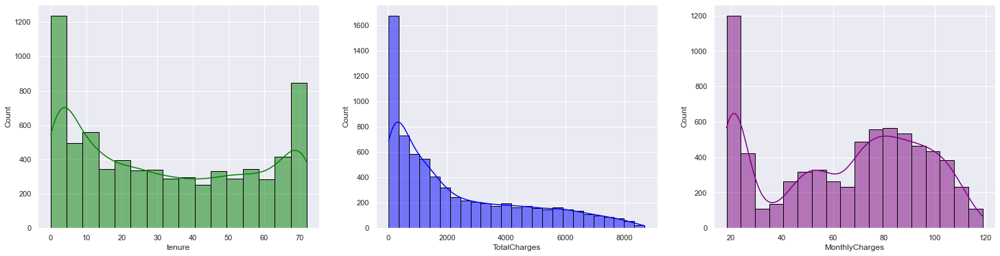

In [21]:
#distribution for the continuous variable
plt.figure(figsize=(25,6))

#distribution of tenure
plt.subplot(1,3,1)
sns.histplot(telecome_df1.tenure, kde= True, color='green', edgecolor = 'black');

#distribution of TotalCharges
plt.subplot(1,3,2)
sns.histplot(telecome_df1.TotalCharges, kde= True, color='blue', edgecolor = 'black');

#distribution of MonthlyCharges
plt.subplot(1,3,3)
sns.histplot(telecome_df1.MonthlyCharges, kde= True, color='purple', edgecolor = 'black');

### Observation:
- TotalCharges is right skewed. Few customter TotalCharges is very high.
- MonthlyCharges also skewed to right.
- Tenure moslty uniformly disctributed, with few range like less than 5 and greater than 70 tenure have little high no.of customers.

In [22]:
#Box plot to check if any outliers in data
#define one fucniton to do box plot
def box_plot(data, columnlist):
    dataset = data
    column_list = columnlist
    length_columnlist = len(columnlist)
    
    #plot colors
    colors_list = ['lightgreen', 'lightblue', 'pink']
    
    if(length_columnlist > 3):
        length_columnlist = 3
    
    #plot the graph
    plt.figure(figsize=(15, 10))
    for i in range(length_columnlist):
        plt.subplot(3, 3, i+1)
        sns.boxplot(data= dataset, x = column_list[i], color = colors_list[i] )

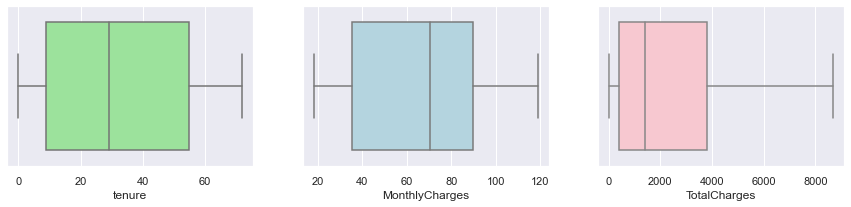

In [23]:
#box plot 'tenure', 'MonthlyCharges', 'TotalCharges'
box_plot(telecome_df1, ['tenure', 'MonthlyCharges', 'TotalCharges'])

### Observation:
- **No outliers in data only MonthlyCharges and TotalCharges is little right skewed**.

### iii. Univariate Analysis for Categorical Variable

In [24]:
#define function to check the count disctribution for categorical variable
def count_plot(data_frame, column_name, hue_in, index_i, index_j, ax):
    
    #based on hue input call diffent countplot:
    if (hue_in == ''):
        ax = sns.countplot(data=data_frame, x=column_name, ax = ax[index_i][index_j])
    else:
        ax = sns.countplot(data=data_frame, x=column_name, hue=hue_in, ax = ax[index_i][index_j])
        
    #This code will add percentage to each bar in  plot
    total = len(data_frame[column_name])    
    for p in ax.patches:    
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100* height/total),
            ha="center")
        ax.set_box_aspect(3/len(ax.patches))

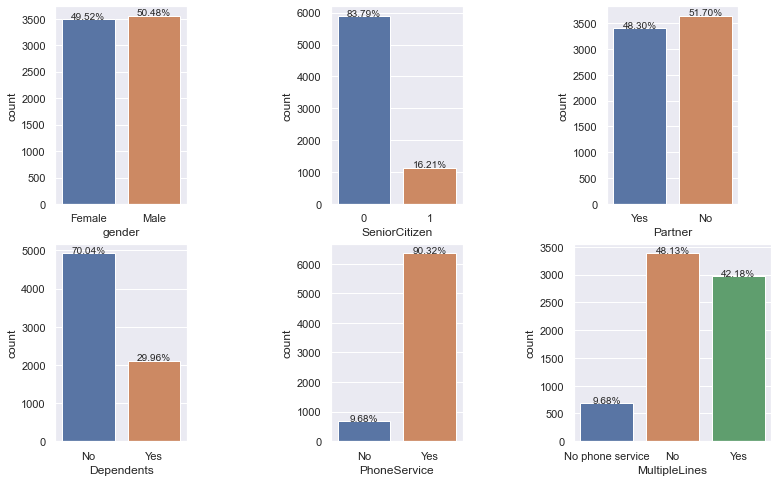

In [25]:
#distribution of categorical variable [gender, SeniorCitizen, Partner]
fig, ax = plt.subplots(2, 3, figsize= (14, 8))
count_plot(telecome_df1, 'gender', '', 0, 0, ax)
count_plot(telecome_df1, 'SeniorCitizen', '', 0, 1, ax)
count_plot(telecome_df1, 'Partner','', 0, 2, ax)

#distribution of categorical variable [Dependents, PhoneService, MultipleLines]
count_plot(telecome_df1, 'Dependents','', 1, 0, ax)
count_plot(telecome_df1, 'PhoneService','', 1, 1, ax)
count_plot(telecome_df1, 'MultipleLines','', 1, 2, ax)

### Observation:
- Gender data eqaually splipt among male and female. Nearly half of customer is male and half is female.
- 16% of customer are SeniorCitizen.So most of cutomer are younger.
- 48% customere have partner. Customer with no Partner is high compare to customer having patner.
- Custer with Dependents is very less (nearly 30%).
- Nearly 90% customer have PhoneService.
- Nearly 42% customer have MultipleLines service.

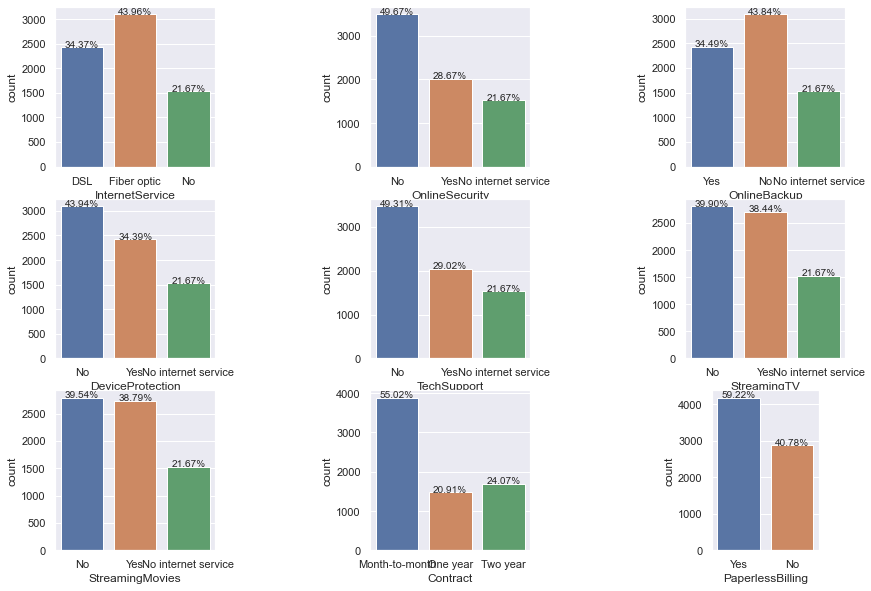

In [26]:
#Distribution of the categorical variables
fig, ax = plt.subplots(3, 3, figsize= (16, 10))
count_plot(telecome_df1, 'InternetService', '', 0, 0, ax)
count_plot(telecome_df1, 'OnlineSecurity', '', 0, 1, ax)
count_plot(telecome_df1, 'OnlineBackup','', 0, 2, ax)

count_plot(telecome_df1, 'DeviceProtection', '', 1, 0, ax)
count_plot(telecome_df1, 'TechSupport', '', 1, 1, ax)
count_plot(telecome_df1, 'StreamingTV', '', 1, 2, ax)

count_plot(telecome_df1, 'StreamingMovies', '', 2, 0, ax)
count_plot(telecome_df1, 'Contract', '', 2, 1, ax)
count_plot(telecome_df1, 'PaperlessBilling', '', 2, 2, ax)

### Observation:
- More number of customer have Fiber Optic and followed by DSL Internet Service. Nearly 22% user dont have Internet Service.
- High no.of Customer dont have Online Security. Nealry 29% have it.
- Nearly 35% customer have online backup. Nearly 44% no online backup rest customer no internet service.
- Nearly 35% customer have DeviceProtection plan. 
- Customer with internet service nealy half of customer StreamingTV and StreamingMovies.
- Customer with month-to-month contract is higher. one yer and two year contract customer are nearly same.
- More number of customer opt paperless Billing.

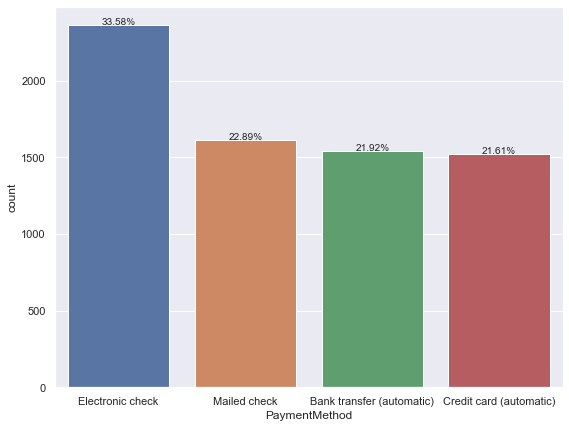

In [27]:
# Distribution of PaymentMethod
fig, ax = plt.subplots(1, 1, figsize= (15,7), squeeze=False)
count_plot(telecome_df1, 'PaymentMethod', '', 0, 0, ax)

- Higher no of customer follows Electronic Check payment method. Rest all customer follow Mailed check, Bank Transfer,Credit card are uniformly distributed approximately same no.of customer.

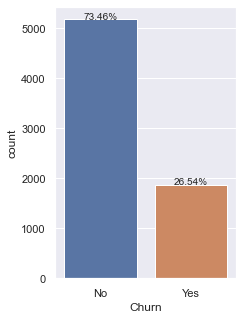

In [28]:
#Distribution of Target variable "Churn"
fig, ax = plt.subplots(1, 1, figsize= (6,5), squeeze=False)
count_plot(telecome_df1, 'Churn', '', 0, 0, ax)

- **Chur customer is very less nealry 26.5%.**

###  iv.Categorical variabvle distribution with the target class

In [29]:
#create one categorical variable list
categorica_attributes = list(telecome_df1.dtypes.loc[telecome_df1.dtypes == 'object'].index)
print('Categorical Variables Attributes:\n',categorica_attributes)

Categorical Variables Attributes:
 ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn']


In [30]:
#check the distribution of categorical variable using crosstab
for var in categorica_attributes:
    if (var != 'Churn'):
        cross_tab_data = pd.crosstab(telecome_df1[var], telecome_df1['Churn'])
        print(cross_tab_data, '\n\n')

Churn     No  Yes
gender           
Female  2549  939
Male    2625  930 


Churn            No   Yes
SeniorCitizen            
0              4508  1393
1               666   476 


Churn      No   Yes
Partner            
No       2441  1200
Yes      2733   669 


Churn         No   Yes
Dependents            
No          3390  1543
Yes         1784   326 


Churn           No   Yes
PhoneService            
No             512   170
Yes           4662  1699 


Churn               No  Yes
MultipleLines              
No                2541  849
No phone service   512  170
Yes               2121  850 


Churn              No   Yes
InternetService            
DSL              1962   459
Fiber optic      1799  1297
No               1413   113 


Churn                  No   Yes
OnlineSecurity                 
No                   2037  1461
No internet service  1413   113
Yes                  1724   295 


Churn                  No   Yes
OnlineBackup                   
No                   185

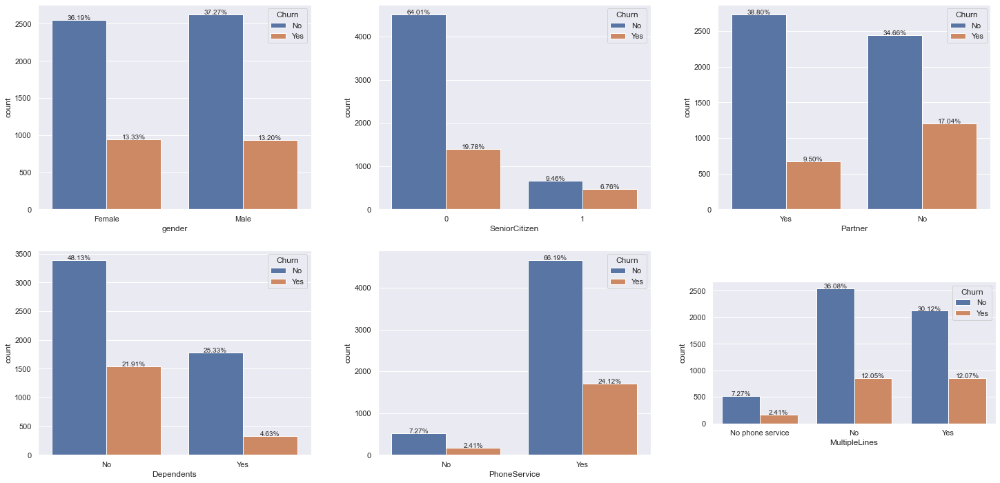

In [31]:
#call count_plot function with hue as 'Churn'
fig, ax = plt.subplots(2, 3, figsize= (25,12))
count_plot(telecome_df1, 'gender','Churn', 0, 0, ax)
count_plot(telecome_df1, 'SeniorCitizen','Churn', 0, 1, ax)
count_plot(telecome_df1, 'Partner', 'Churn', 0, 2, ax)

count_plot(telecome_df1, 'Dependents','Churn', 1, 0, ax)
count_plot(telecome_df1, 'PhoneService','Churn',1, 1, ax)
count_plot(telecome_df1, 'MultipleLines','Churn', 1, 2, ax)

### Observation
- The customer churn ratio for male and female nearly same. So it looks like geneder have no dependancy with customer churn.
- Younger customer churn is more nearly 20% but if we observe the churn ratio compare to customer category, then Senior Citizen churn ratio more than 60%.
- churn ratio of customer without partner is more compare to with partner.
- Customer with no dependants have high churn ratio.
- Customer with phone service have high churn ratio compare to customer with no phone service.
- Customer without multiplelines have little high churn ratio compare to customer with multiple lines.

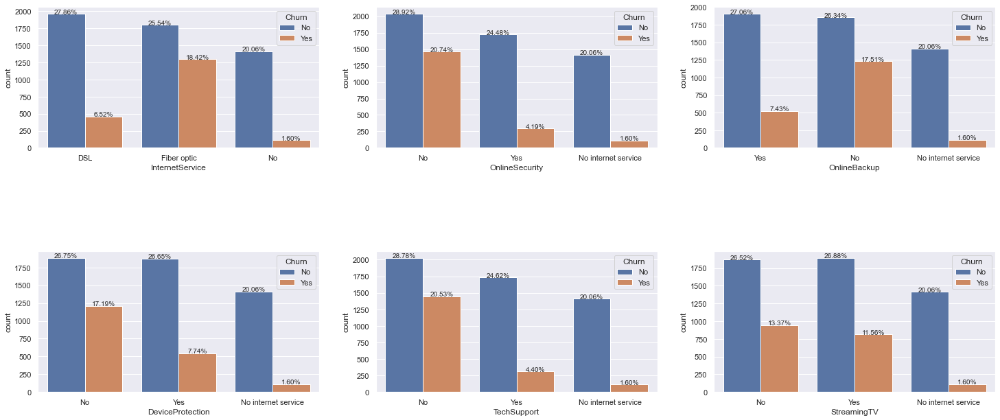

In [32]:
# distribution of categorical variable respect to "Churn"
fig, ax = plt.subplots(2, 3, figsize= (25, 12))
count_plot(telecome_df1, 'InternetService','Churn', 0, 0, ax)
count_plot(telecome_df1, 'OnlineSecurity','Churn',0, 1, ax)
count_plot(telecome_df1, 'OnlineBackup','Churn', 0, 2, ax)

count_plot(telecome_df1, 'DeviceProtection','Churn', 1, 0, ax)
count_plot(telecome_df1, 'TechSupport','Churn',1, 1, ax)
count_plot(telecome_df1, 'StreamingTV','Churn', 1, 2, ax)

### Observation:
- Customer with fiber optic internet service churn ratio is very high compare to DSL internet service.
- Customer without OnlineSecurity churn ratio is very high.
- Customer without OnlineBackup churn ratio is high compare to customer with Online Backup.
- Customer without DeviceProtection plan churn ratio is high compare to customer with DeviceProtection.
- Those Customer take no techSupport have high churn ratio.
- Customer which have streamingTV or not, on an average have same churn ratio.

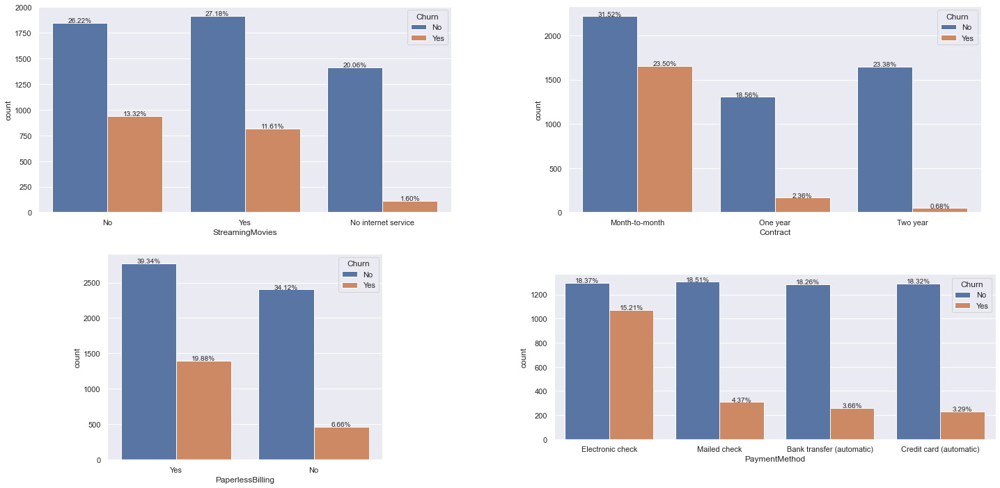

In [33]:
# distribution of categorical variable respect to "Churn"
fig, ax = plt.subplots(2, 2, figsize= (25, 12))
count_plot(telecome_df1, 'StreamingMovies','Churn', 0, 0, ax)
count_plot(telecome_df1, 'Contract','Churn',0, 1, ax)

count_plot(telecome_df1, 'PaperlessBilling','Churn', 1, 0, ax)
count_plot(telecome_df1, 'PaymentMethod','Churn', 1, 1, ax)

### Observation:


- Customer on Month-to-month contracts, have more churn ratio.
- Customer who opted papar bill have higher rate of churn.
- Automatic payments (Credit card, Bank transfer) show lower churn ratio.
- customer with Streaming Movie or not not  have nealry equal churn ratio.

**Note:** From abobe Categorical data observation we can inference Customers with  "Fiber Optic service", "internet service", 
    "Onlinr Backup","month-to-month contract", "paperless billing" and "Electronic Check" have higher rate of churn ratio.

### Chi Square test
- The Pearson’s Chi-Square statistical hypothesis is a test for independence between categorical variables.
- To check if the categorica feature have any influence on target class (churn).

In [34]:
#Import the scientific package (scipy and chi2_contingency)
import scipy.stats as stats
from scipy.stats import chi2_contingency

class ChiSquare:
    def __init__(self, dataframe):
        self.df = dataframe
        self.p = None     #P-Value
        self.chi2 = None  #Chi Test Statistic
        self.dof = None
        
        self.df_Observed = None
        self.df_Expected = None
        
    def chisquare_test_result(self, colX, alpha):
        result = ""
        if self.p < alpha:
            result = "{0} is IMPORTANT for Prediction.".format(colX)
        else:
            result = "{0} is NOT an important predictor. ( {0} can be discarded from predictor list of model !!)".format(colX)

        print(result, '\n')
        
    def test_independence(self, colX, colY, alpha=0.05):
        X = self.df[colX].astype(str)
        Y = self.df[colY].astype(str)
        
        self.df_Observed = pd.crosstab(Y, X) 
        
        #print(self.dfObserved)
        chi2, p, dof, expected = stats.chi2_contingency(self.df_Observed.values)
        self.p = p
        self.chi2 = chi2
        self.dof = dof 
        
        p_value= p  #"{:.15f}".format(float(p))
        print(' chi Squre:', chi2, '\n p value:', p_value, '\n dof:', dof, '\n expected:', expected)
        self.df_Expected = pd.DataFrame(expected, columns=self.df_Observed.columns, index = self.df_Observed.index)
        
        #print the result of chisqurare stats
        self.chisquare_test_result(colX, alpha)

df = telecome_df1

#Initialize ChiSquare Class
ct = ChiSquare(df)

#Feature Selection
for var in categorica_attributes:
    ct.test_independence(colX=var, colY="Churn" ) 

 chi Squre: 0.4840828822091383 
 p value: 0.48657873605618596 
 dof: 1 
 expected: [[2562.38989067 2611.61010933]
 [ 925.61010933  943.38989067]]
gender is NOT an important predictor. ( gender can be discarded from predictor list of model !!) 

 chi Squre: 159.42630036838742 
 p value: 1.510066805092378e-36 
 dof: 1 
 expected: [[4335.05239245  838.94760755]
 [1565.94760755  303.05239245]]
SeniorCitizen is IMPORTANT for Prediction. 

 chi Squre: 158.7333820309922 
 p value: 2.1399113440759935e-36 
 dof: 1 
 expected: [[2674.78830044 2499.21169956]
 [ 966.21169956  902.78830044]]
Partner is IMPORTANT for Prediction. 

 chi Squre: 189.12924940423474 
 p value: 4.9249216612154196e-43 
 dof: 1 
 expected: [[3623.93042737 1550.06957263]
 [1309.06957263  559.93042737]]
Dependents is IMPORTANT for Prediction. 

 chi Squre: 0.9150329892546948 
 p value: 0.3387825358066928 
 dof: 1 
 expected: [[ 501.01774812 4672.98225188]
 [ 180.98225188 1688.01774812]]
PhoneService is NOT an important predic

### Observation:
- From Chi Square test its indicate 'gender' column not an important feature for prediction. Can be drop from the model feature list.

### ANOVA test
- ANOVA test to check the corr/association of continuous variable with targent class.

In [35]:
# ANOVA test
import scipy.stats as stats

#Continuous variable list
continuous_var = telecome_df1[['tenure', 'MonthlyCharges', 'TotalCharges']]

#get the rsult of anova test
for var in continuous_var:    
    result  = stats.f_oneway(telecome_df1[var][telecome_df1['Churn'] == 'Yes'], 
                             telecome_df1[var][telecome_df1['Churn'] == 'No'])
    
    #print the result of anoval test
    print(var, ':', result)
    #print(result)
    #print(var,':', 'F_stats =', F_stats, 'p_value=', p_value, '\n')
    

tenure : F_onewayResult(statistic=997.2680104991438, pvalue=7.999057960610892e-205)
MonthlyCharges : F_onewayResult(statistic=273.4637042077133, pvalue=2.7066456068950115e-60)
TotalCharges : F_onewayResult(statistic=290.43983799153403, pvalue=7.50858333010362e-64)


- Since p-value is below 0.05(95% confidence level) so all the continuous variable have some influence on target class.

### v.Convert categorical variable  to continuous variable

In [36]:
label_encoding = {
                    "Partner": {
                            "Yes": 1,
                            "No": 0
                        },
                        "Dependents": {
                            "Yes": 1,
                            "No": 0
                        },
                        "PhoneService": {
                            "Yes": 1,
                            "No": 0
                        },
                        "MultipleLines": {
                            "Yes": 2,
                            "No": 1,
                            "No phone service": 0
                        },
                        "InternetService": {
                            "Fiber optic": 2,
                            "DSL": 1,
                            "No": 0
                        },
                        "OnlineSecurity": {
                            "Yes": 2,
                            "No": 1,
                            "No internet service": 0
                        },
                        "OnlineBackup": {
                            "Yes": 2,
                            "No": 1,
                            "No internet service": 0
                        },
                        "DeviceProtection": {
                            "Yes": 2,
                            "No": 1,
                            "No internet service": 0
                        },
                        "TechSupport": {
                            "Yes": 2,
                            "No": 1,
                            "No internet service": 0
                        },
                        "StreamingTV": {
                            "Yes": 2,
                            "No": 1,
                            "No internet service": 0
                        },
                        "StreamingMovies": {
                            "Yes": 2,
                            "No": 1,
                            "No internet service": 0
                        },
                        "Contract": {
                            "Two year": 2,
                            "One year": 1,
                            "Month-to-month": 0
                        },
                         "PaperlessBilling": {
                            "Yes": 1,
                            "No": 0
                        },
                        "PaymentMethod": {
                            "Credit card (automatic)": 1,
                            "Bank transfer (automatic)": 1,
                            "Mailed check": 0,
                            "Electronic check": 0
                        },
                        "Churn": {
                            "Yes": 1,
                            "No": 0
                        },
                        "gender": {
                            "Male": 1,
                            "Female": 0
                        }
                    }

for column, val_mapping in label_encoding.items():
    telecome_df1[column] = telecome_df1[column].apply(lambda i: val_mapping[i])

In [37]:
#check the sample data
telecome_df1.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1.0,0,0,1,1,2,1,1,1,1,0,1,0,29.85,29.85,0
1,1,0,0,0,34.0,1,1,1,2,1,2,1,1,1,1,0,0,56.95,1889.50,0
2,1,0,0,0,2.0,1,1,1,2,2,1,1,1,1,0,1,0,53.85,108.15,1
3,1,0,0,0,45.0,0,0,1,2,1,2,2,1,1,1,0,1,42.30,1840.75,0
4,0,0,0,0,2.0,1,1,2,1,1,1,1,1,1,0,1,0,70.70,151.65,1


- **All the categorica variables changed to numerical data.**

In [38]:
#Change SeniorCitizen  to numberic
telecome_df1['SeniorCitizen'] = telecome_df1['SeniorCitizen'].astype(np.int64) 
telecome_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   int64  
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   int64  
 3   Dependents        7043 non-null   int64  
 4   tenure            7043 non-null   float64
 5   PhoneService      7043 non-null   int64  
 6   MultipleLines     7043 non-null   int64  
 7   InternetService   7043 non-null   int64  
 8   OnlineSecurity    7043 non-null   int64  
 9   OnlineBackup      7043 non-null   int64  
 10  DeviceProtection  7043 non-null   int64  
 11  TechSupport       7043 non-null   int64  
 12  StreamingTV       7043 non-null   int64  
 13  StreamingMovies   7043 non-null   int64  
 14  Contract          7043 non-null   int64  
 15  PaperlessBilling  7043 non-null   int64  
 16  PaymentMethod     7043 non-null   int64  


- **All the attribute change to numeric datatype**

## vi.Bivariate and Multivariate Analysis

### Correlation Matrix

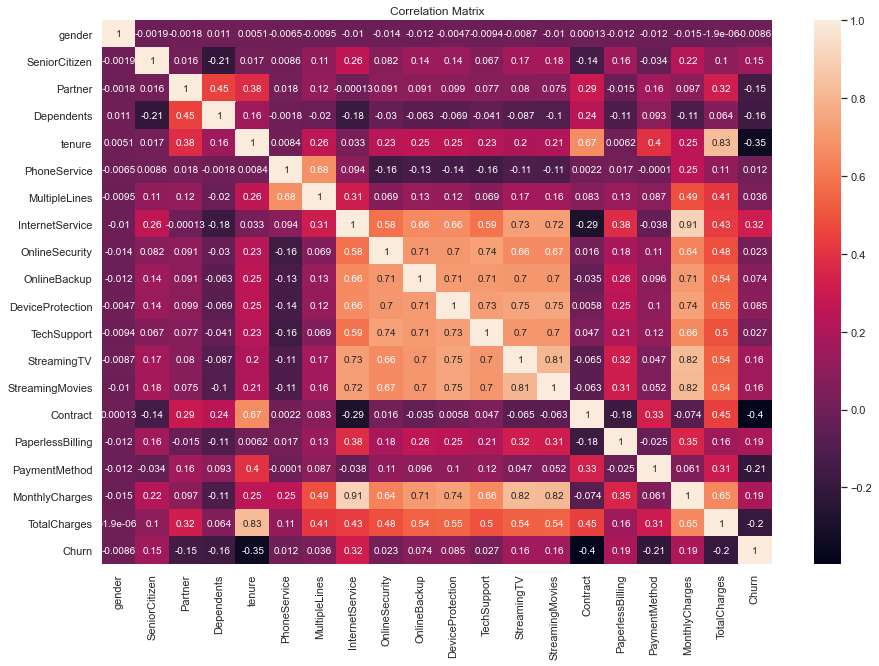

In [39]:
#get the correlation matrix
corr = telecome_df1.corr()

##plot heatmap
plt.figure(figsize=(15,10))
plt.title('Correlation Matrix')
sns.heatmap(corr, annot = True);

### Observartion:
- Correlation matrix indicate "tenure" and "TotalCharges" have little high correlation.
- Rest all looks fine.
- I ll be not dropping tenure from model now. we ll check the feature importance then we ll decide on the attributes.

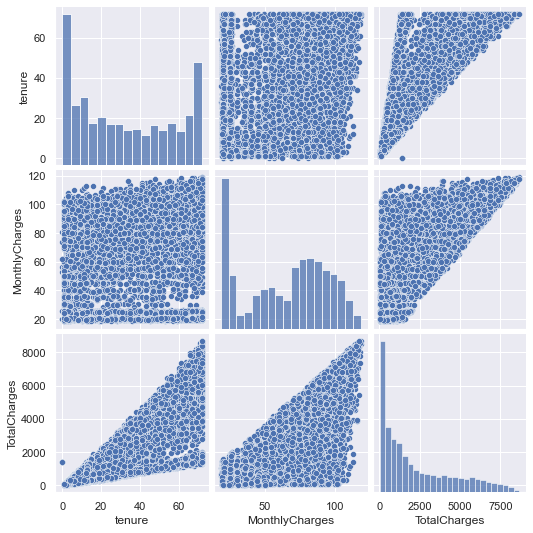

In [40]:
#pair plot for the continuous variables
sns.pairplot(data=telecome_df1, x_vars=['tenure','MonthlyCharges','TotalCharges'],
            y_vars=['tenure','MonthlyCharges','TotalCharges'])

### Observation:
- **TotalCharges and tenure have high correlation.**
- **MonthlyCharges and TotalCharges have little correlation.**

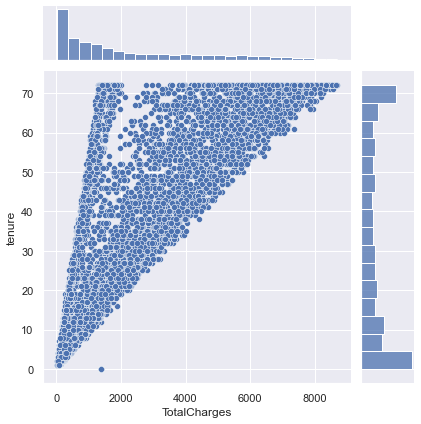

In [41]:
#joint plot for Totalchanges and tenure
sns.jointplot(data=telecome_df1, x='TotalCharges', y='tenure')

- **Here we can see there is a correlation between thse two attributes.**

### vii. Distribution of continuous variable respect to target class

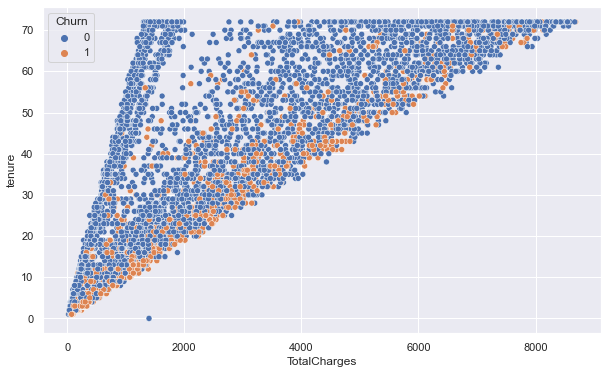

In [42]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="TotalCharges", y="tenure", hue="Churn", data=telecome_df1);

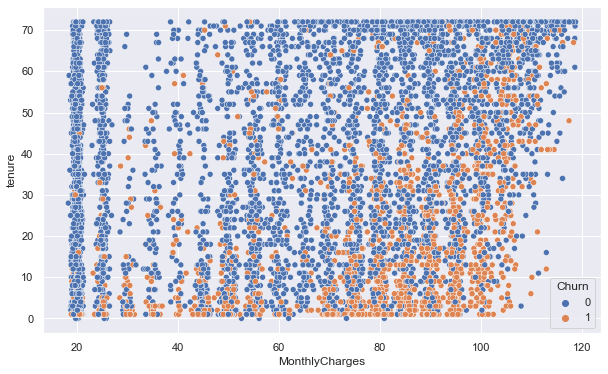

In [43]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='MonthlyCharges', y='tenure', hue='Churn', data = telecome_df1);

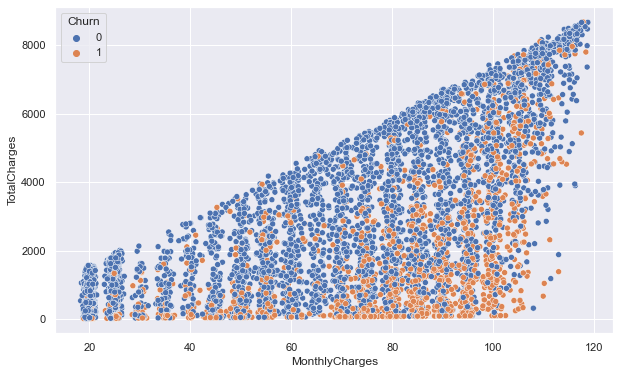

In [44]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="MonthlyCharges", y="TotalCharges", hue="Churn", data=telecome_df1);

### Observation:
- From above plot we can inferecne when tenure increase total changes also increasing.
- Customer with tenure more than 40 have less churn ration compare to cuser tenure less than 40.
- No reation between tenure and monthly changes respect to churn ratio.
- Also we can inference when monthly changes increase churn ratio also inscrease.

# 4. Data pre-processing: 

### i.Apply Feature Scaling

In [45]:
# since MonthlyCharges, TotalCharges and tenure data have different scale compare to other fields so better normalize the data
# Normalizing using min max scler
min_MonthlyCharges = telecome_df1['MonthlyCharges'].min()
max_MonthlyCharges = telecome_df1['MonthlyCharges'].max()

min_TotalCharges  = telecome_df1['TotalCharges'].min()
max_TotalCharges = telecome_df1['TotalCharges'].max()

min_tenure  = telecome_df1['tenure'].min()
max_tenure = telecome_df1['tenure'].max()

In [46]:
#Normalized the data
telecome_df1['MonthlyCharges'] =  round((telecome_df1['MonthlyCharges'] - min_MonthlyCharges ) /(max_MonthlyCharges - min_MonthlyCharges), 3)
telecome_df1['TotalCharges'] =  round((telecome_df1['TotalCharges'] - min_TotalCharges ) /(max_TotalCharges - min_TotalCharges), 3)
telecome_df1['tenure'] =  round((telecome_df1['tenure'] - min_tenure ) /(max_tenure - min_tenure), 3)

In [47]:
#check data afer applied feature scaling
telecome_df1.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,0.014,0,0,1,1,2,1,1,1,1,0,1,0,0.115,0.001,0
1,1,0,0,0,0.472,1,1,1,2,1,2,1,1,1,1,0,0,0.385,0.216,0
2,1,0,0,0,0.028,1,1,1,2,2,1,1,1,1,0,1,0,0.354,0.010,1
3,1,0,0,0,0.625,0,0,1,2,1,2,2,1,1,1,0,1,0.239,0.210,0
4,0,0,0,0,0.028,1,1,2,1,1,1,1,1,1,0,1,0,0.522,0.015,1


- **We can see now the MonthlyCharges, TotalCharges and tenure is normalized.**

In [48]:
## As from Chi Square test we have ensure geneder is not the adding any value to prediction, so we can drop the column from feature list
telecome_df1 = telecome_df1.drop('gender', axis=1)


### i. Split the dataset into training and testing sets

In [49]:
#import the sklearn package
from sklearn.model_selection import train_test_split

#split predictor and target variable
X = telecome_df1.drop('Churn', axis=1)
y = telecome_df1['Churn']

#Split the data into training and test set [80% training and 20% for test]
X_train1, X_test, y_train1, y_test = train_test_split(X, y, test_size = 0.20, random_state= 45)   # random cab be used also stratify=y

- **Splited the data into training and test set [80% training and 20% for test]**

### ii .Check if the train and test data have similar statistical characteristics when compared with original data

In [50]:
#let take MonthlyCharges and do a T-test theck the mean of population and sample is same or not
Monthly_charge = telecome_df1['MonthlyCharges']
mu = Monthly_charge.mean()
sigma = Monthly_charge.std(ddof=0)
print("mu: ", mu, ", sigma:", sigma)

train_smaple_Monthly_charge = X_train1.MonthlyCharges[:50]
test_smaple_Monthly_charge = X_test.MonthlyCharges[:50]

x_bar_train= train_smaple_Monthly_charge.mean() # Smaple mean
x_bar_test = test_smaple_Monthly_charge.mean()
N = 50

#H0: Sample take from same Telecome churn data
#H1: Sample not taken from Telecome churn data

print("x_bar_train: ", x_bar_train, ", sample_size:", N)
print("x_bar_test: ", x_bar_test, ", sample_size:", N, '\n')
#take alpha 0.05
z_critical = 1.96 # alpha level of 0.05 and two-tailed test

SE = sigma/np.sqrt(N)
z_stat_train = (x_bar_train - mu)/SE
z_stat_test  = (x_bar_test - mu)/SE
print('Training Z_stats:', z_stat_train)
print('Test Z_stats:', z_stat_test)

mu:  0.4627586255856851 , sigma: 0.29940887326002463
x_bar_train:  0.37127999999999994 , sample_size: 50
x_bar_test:  0.48244 , sample_size: 50 

Training Z_stats: -2.1604288403666216
Test Z_stats: 0.464810316404593


- **I have check one attributes from the sample. Also we can varify all the field using data visualization**
- **From above test we can conclude the train and test data came from same population.**

## Observation:
- Since Z_stats is less than the z_critical for both test and train sample taken from X_train and X_test. so both the sample taken from the same population.

### ii. Check for target balancing and fix it if found imbalanced.

0    4118
1    1516
Name: Churn, dtype: int64


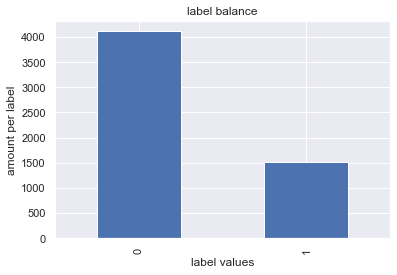

In [51]:
#check teh distribution of target class between train and test
y_train1.value_counts().plot(kind='bar')
plt.title('label balance')
plt.xlabel('label values')
plt.ylabel('amount per label');
print(y_train1.value_counts());

0    1056
1     353
Name: Churn, dtype: int64


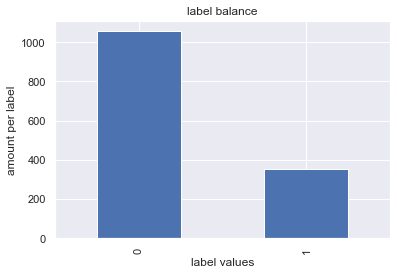

In [52]:
#check teh distribution of target class
y_test.value_counts().plot(kind='bar')
plt.title('label balance')
plt.xlabel('label values')
plt.ylabel('amount per label')
print(y_test.value_counts());

- **As we can see abobe data distribution of churn is imbalace (churn ratio is very less). So for better prdiction we need to balance the training data.**


### Apply Synthetic Minority Oversampling Technique (SMOTE) to Balance the target field:

In [53]:
# import library
from imblearn.over_sampling import SMOTE
smote = SMOTE()

# fit predictor and target variable
X_train, y_train = smote.fit_resample(X_train1, y_train1)

print('Original dataset shape', y_train1.shape)
print('Resample dataset shape', y_train.shape)

Original dataset shape (5634,)
Resample dataset shape (8236,)


1    4118
0    4118
Name: Churn, dtype: int64


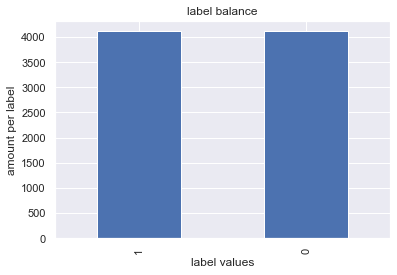

In [54]:
#check the distribution of churn after oversampling
y_train.value_counts().plot(kind='bar')
plt.title('label balance')
plt.xlabel('label values')
plt.ylabel('amount per label')
print(y_train.value_counts());

- **Now training data is balanced, as we can see above distribution of churn ratio.**

## 5.Model training, testing and tuning:

### i.First we can use DecisionTreeClassifier and check the model accuracy

In [55]:
#instantiating decision tree as the default model
dt_model = DecisionTreeClassifier(criterion='gini', random_state= 1)
dt_model.fit(X_train, y_train);

In [56]:
y_pred = dt_model.predict(X_test)
print('DecisionTreeClassifier model trainin score:',dt_model.score(X_train, y_train))
print('DecisionTreeClassifier model test score:',dt_model.score(X_test , y_test))

DecisionTreeClassifier model trainin score: 0.9964788732394366
DecisionTreeClassifier model test score: 0.7083037615330021


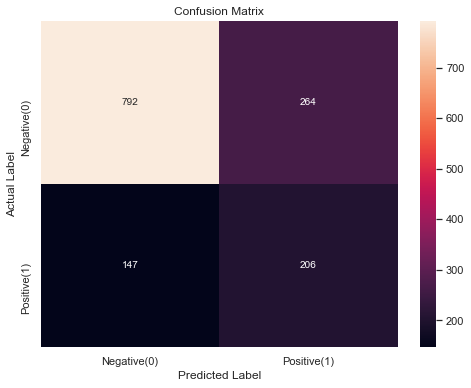

In [57]:
cm = confusion_matrix(y_test, y_pred)
class_label = ["Negative(0)", "Positive(1)"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)

#plot the graph
plt.figure(figsize=(8,6))
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

### Observation:
- Only hyperparameter criterion is set to 'gini' since most of features we have categorical in nature. As we can see without pruning the decision tree is overfitting (Training accuracy is very high but test accuracy is low).

In [58]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.75      0.79      1056
           1       0.44      0.58      0.50       353

    accuracy                           0.71      1409
   macro avg       0.64      0.67      0.65      1409
weighted avg       0.74      0.71      0.72      1409



- **From model stats we can see precision and recall is very less and f1 score also less**

In [59]:
# Decision tree graph
from sklearn.tree import export_graphviz
from six import StringIO 
from IPython.display import Image  
import pydotplus
import graphviz

xvar = telecome_df1.drop('Churn', axis=1)
feature_cols = xvar.columns

In [60]:
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('customer_churn.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.409388 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.409388 to fit



- **Since pruning not apply in decision tree the tree have huge no.of nodes (Tree grown till each class properly classified).**

### Cross validation to find the appropiate tree depth:

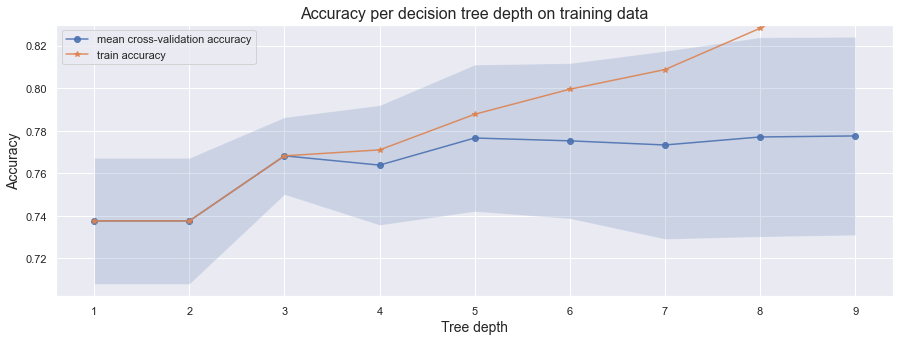

In [61]:
from sklearn.model_selection import cross_val_score
# function for fitting trees of various depths on the training data using cross-validation
def run_cross_validation_on_trees(X_var, y_var, tree_depths, cv=5, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_std = []
    cv_scores_mean = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = DecisionTreeClassifier(max_depth=depth)
        cv_scores = cross_val_score(tree_model, X_var, y_var, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X_var, y_var).score(X_var, y_var))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores
  
# function for plotting cross-validation results
def plot_cross_validation_on_trees(depths, cv_scores_mean, cv_scores_std, accuracy_scores, title):
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    ax.plot(depths, cv_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
    ax.fill_between(depths, cv_scores_mean-2*cv_scores_std, cv_scores_mean + 2*cv_scores_std, alpha=0.2)
    ylim = plt.ylim()
    ax.plot(depths, accuracy_scores, '-*', label='train accuracy', alpha=0.9)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Tree depth', fontsize=14)
    ax.set_ylabel('Accuracy', fontsize=14)
    ax.set_ylim(ylim)
    ax.set_xticks(depths)
    ax.legend()

# fitting trees of depth 1 to 24
sm_tree_depths = range(1,10)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(X_train, y_train, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')

- **From cross validation we can see tree with depth 3 train and cross validation accuracy is nealy same after that training accuracy sudden increase but cross validation accuracy remain same**

### ii. Decision tree with optimize hyper parameter.

In [62]:
#instantiating decision tree with max_depth = 3
dt_model_1 = DecisionTreeClassifier(criterion='gini', max_depth= 3, min_samples_split= 2,  random_state= 1)
dt_model_1.fit(X_train, y_train);

In [63]:
y_pred1 = dt_model_1.predict(X_test)
print('DecisionTreeClassifier model trainin score:',dt_model_1.score(X_train, y_train))
print('DecisionTreeClassifier model test score:',dt_model_1.score(X_test , y_test))

DecisionTreeClassifier model trainin score: 0.7682127246236037
DecisionTreeClassifier model test score: 0.7452093683463449


In [64]:
print(classification_report(y_test, y_pred1))

              precision    recall  f1-score   support

           0       0.91      0.73      0.81      1056
           1       0.49      0.80      0.61       353

    accuracy                           0.75      1409
   macro avg       0.70      0.76      0.71      1409
weighted avg       0.81      0.75      0.76      1409



### Observation:
- from corss validation we can observ max_depth = 3 the accuracy is better.
- Model accuaracy is nearly 76%. 
- below section we ll moltiple model and find the best model for this the given problem.

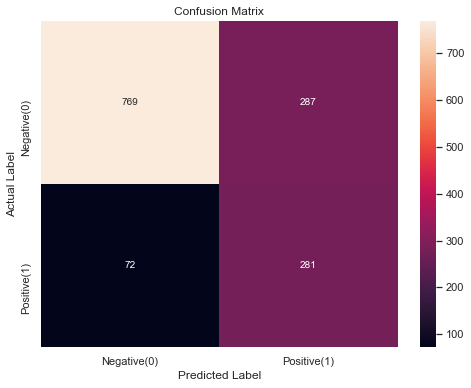

In [65]:
cm = confusion_matrix(y_test, y_pred1)
class_label = ["Negative(0)", "Positive(1)"]
df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)

#plot the graph
plt.figure(figsize=(8,6))
sns.heatmap(df_cm, annot = True, fmt = "d")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

- **False positive still very high as we can observe from the confusion matrix**

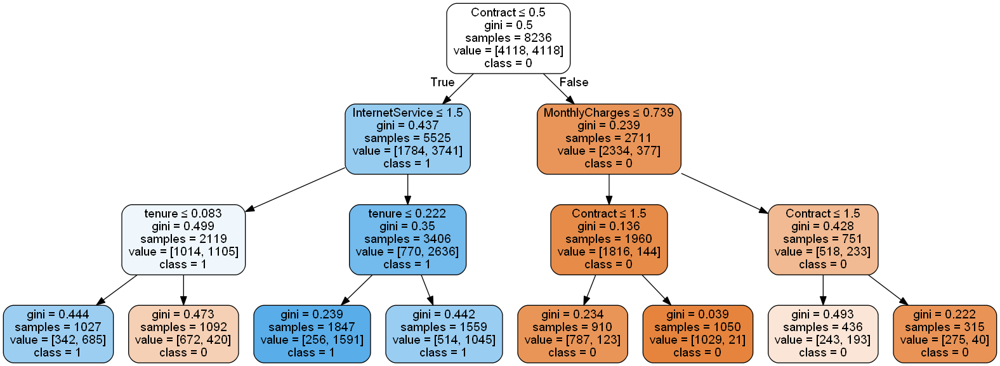

In [66]:
# Decision tree graph
dot_data = StringIO()
export_graphviz(dt_model_1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('customer_churn.png')
Image(graph.create_png())

In [67]:
## Calculating feature importance
feat_importance = dt_model_1.tree_.compute_feature_importances(normalize=False)

feat_imp_dict = dict(zip(X_train.columns, dt_model_1.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)[0:10] #Top 10 features

,0
Contract,0.746901
InternetService,0.112823
tenure,0.099024
MonthlyCharges,0.041253
SeniorCitizen,0.000000
TechSupport,0.000000
PaymentMethod,0.000000
PaperlessBilling,0.000000
StreamingMovies,0.000000
StreamingTV,0.000000


- **As we can see from feature importance Contract, tenure, MonthlyCharges and TechSupport consider as important feature for prediction in case of decision tree modeling.**

### iii.Use ensembles and find the best model.

In [68]:
# Define one common funtion to impletment muliple model 
def model_evaluation(model_name, model, input_rel):    
    start = time.time()  # note the start time 
    model.fit(X_train, y_train)
    
    #prediction
    ypred = model.predict(X_test)
    
    #model name
    print(model_name)
    
    #confusion matrix
    print(confusion_matrix (y_test, ypred))
    
    #classifiction matrix
    #print(classification_report(y_test,ypred))
    
    trianing_score = model.score(X_train, y_train)
    acc_score = accuracy_score(y_test, ypred)
    
    recall = recall_score(y_test, ypred)
    precision = precision_score(y_test, ypred)
    f1 = f1_score(y_test,ypred)
    
    end = time.time()  #note the end time
    duration = end - start  # calculate the total duration
    
    #Store the accuracy results for each model in a dataframe for final comparison
    tempResultsDf = pd.DataFrame({'Model_Name':[model_name], 'trianing_score': trianing_score, 
                              'accuracy': acc_score, 'precision': precision, 
                              'recall': recall, 'f1-score': f1, 'duration':duration })  
        
    resultsDf = pd.concat([input_rel, tempResultsDf])    
    resultsDf1 = resultsDf[['Model_Name', 'trianing_score', 'accuracy', 'precision', 'recall', 'f1-score', 'duration']]
    return resultsDf1

### Models without tuning the hyperparameter

In [69]:
#LogisticRegression model
resultsDf = pd.DataFrame()
lr = LogisticRegression() 
result_out = pd.DataFrame()
result_out = model_evaluation('LogisticRegression', lr, resultsDf)
result_out

LogisticRegression
[[777 279]
 [ 75 278]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979


In [70]:
#DecisionTreeClassifier model
dt = DecisionTreeClassifier(criterion='gini', random_state=1)
result_out = model_evaluation('DecisionTreeClassifier', dt, result_out)
result_out

DecisionTreeClassifier
[[792 264]
 [147 206]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416


In [71]:
#BaggingClassifier
bgcl = BaggingClassifier(random_state=22)
result_out = model_evaluation('BaggingClassifier', bgcl, result_out)
result_out

BaggingClassifier
[[867 189]
 [140 213]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416
0,BaggingClassifier,0.987130,0.766501,0.529851,0.603399,0.564238,0.245062


In [72]:
#RandomForestClassifier
rdcl = RandomForestClassifier(random_state=1)
result_out = model_evaluation('RandomForestClassifier', rdcl, result_out)
result_out

RandomForestClassifier
[[849 207]
 [118 235]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416
0,BaggingClassifier,0.987130,0.766501,0.529851,0.603399,0.564238,0.245062
0,RandomForestClassifier,0.996479,0.769340,0.531674,0.665722,0.591195,0.787595


In [73]:
#AdaBoostClassifier
abcl = AdaBoostClassifier(random_state=1)
result_out = model_evaluation('AdaBoostClassifier', abcl, result_out)
result_out

AdaBoostClassifier
[[783 273]
 [ 63 290]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416
0,BaggingClassifier,0.987130,0.766501,0.529851,0.603399,0.564238,0.245062
0,RandomForestClassifier,0.996479,0.769340,0.531674,0.665722,0.591195,0.787595
0,AdaBoostClassifier,0.791282,0.761533,0.515098,0.821530,0.633188,0.343475


In [74]:
#GradientBoostingClassifier
gbcl = GradientBoostingClassifier(random_state=1)
result_out = model_evaluation('GradientBoostingClassifier', gbcl, result_out)
result_out

GradientBoostingClassifier
[[792 264]
 [ 74 279]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416
0,BaggingClassifier,0.987130,0.766501,0.529851,0.603399,0.564238,0.245062
0,RandomForestClassifier,0.996479,0.769340,0.531674,0.665722,0.591195,0.787595
0,AdaBoostClassifier,0.791282,0.761533,0.515098,0.821530,0.633188,0.343475
0,GradientBoostingClassifier,0.813259,0.760114,0.513812,0.790368,0.622768,0.848161


In [75]:
#XGBClassifier
xgb = XGBClassifier(random_state=1)
result_out = model_evaluation('XGBClassifier', xgb, result_out)
result_out

[13:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBClassifier
[[847 209]
 [113 240]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416
0,BaggingClassifier,0.987130,0.766501,0.529851,0.603399,0.564238,0.245062
0,RandomForestClassifier,0.996479,0.769340,0.531674,0.665722,0.591195,0.787595
0,AdaBoostClassifier,0.791282,0.761533,0.515098,0.821530,0.633188,0.343475
0,GradientBoostingClassifier,0.813259,0.760114,0.513812,0.790368,0.622768,0.848161
0,XGBClassifier,0.937227,0.771469,0.534521,0.679887,0.598504,0.342665


In [76]:
#CatBoostClassifier
cat = CatBoostClassifier(verbose=0, random_state=1)
result_out = model_evaluation('CatBoostClassifier', cat, result_out)
result_out

CatBoostClassifier
[[840 216]
 [ 90 263]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416
0,BaggingClassifier,0.987130,0.766501,0.529851,0.603399,0.564238,0.245062
0,RandomForestClassifier,0.996479,0.769340,0.531674,0.665722,0.591195,0.787595
0,AdaBoostClassifier,0.791282,0.761533,0.515098,0.821530,0.633188,0.343475
0,GradientBoostingClassifier,0.813259,0.760114,0.513812,0.790368,0.622768,0.848161
0,XGBClassifier,0.937227,0.771469,0.534521,0.679887,0.598504,0.342665
0,CatBoostClassifier,0.883681,0.782825,0.549061,0.745042,0.632212,4.357633


In [77]:
#LGBMClassifier
lgcl = LGBMClassifier(random_state=1)
result_out = model_evaluation('LGBMClassifier', lgcl, result_out)
result_out

LGBMClassifier
[[829 227]
 [ 92 261]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.748758,0.499102,0.787535,0.610989,0.064979
0,DecisionTreeClassifier,0.996479,0.708304,0.438298,0.583569,0.500608,0.039416
0,BaggingClassifier,0.987130,0.766501,0.529851,0.603399,0.564238,0.245062
0,RandomForestClassifier,0.996479,0.769340,0.531674,0.665722,0.591195,0.787595
0,AdaBoostClassifier,0.791282,0.761533,0.515098,0.821530,0.633188,0.343475
0,GradientBoostingClassifier,0.813259,0.760114,0.513812,0.790368,0.622768,0.848161
0,XGBClassifier,0.937227,0.771469,0.534521,0.679887,0.598504,0.342665
0,CatBoostClassifier,0.883681,0.782825,0.549061,0.745042,0.632212,4.357633
0,LGBMClassifier,0.881860,0.773598,0.534836,0.739377,0.620690,0.105143


### Observation:
- As we can see from above report. LGBMClassifier the accuracy is hight and it took very less time. Also it looks like model little overfit(Since the training score is nealry 90% and accuracy is nearly 80%).
- GradientBoostingClassifier the F1-Scroe is good and model is balanced if we check the training and testing score. But it model execution time is little more.
- LogisticRegression also did well. Accuracy is little less but the training and tesing score look balanced and execution time is very less.
- Wiout tuning hyper parameter we can say GradientBoostingClassifier and AdaBoostClassifier perdforming well. we can choose GradientBoostingClassifier as the accuracy is so high.
- Rest of model little overfit.

- **Now we ll ture the hyper parameter and find the best model in next step.**

## Apply all the possible tuning techniques to train the best model for the given data.

In [78]:
# example of grid searching key hyperparametres for logistic regression
from sklearn.datasets import make_blobs
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

def model_tuning(model, grid):
   
    # define models and parameters
    cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=1)
    grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv,error_score=0)
    grid_result = grid_search.fit(X_train, y_train)
    
    # summarize results
    y_pred = grid_result.predict(X_test)
    print('Accuracy:',accuracy_score(y_test, y_pred))
    print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

In [79]:
#LogisticRegression
model = LogisticRegression(random_state=1) 
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [10, 1.0, 0.1, 0.01]

# define grid search
grid = dict(solver = solvers, penalty = penalty, C = c_values, random_state=[1])
model_tuning(model, grid)

Accuracy: 0.7494677075940384
Best: 0.782054 using {'C': 1.0, 'penalty': 'l2', 'random_state': 1, 'solver': 'liblinear'}


In [80]:
resultsDf2 = pd.DataFrame()
result_out = pd.DataFrame()
lr = LogisticRegression(C=1.0, penalty='l2', solver= 'liblinear', random_state=1)
result_out = model_evaluation('LogisticRegression', lr, resultsDf2)
result_out

LogisticRegression
[[777 279]
 [ 74 279]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.5,0.790368,0.612514,0.034452


In [81]:
#DecisionTreeClassifier 
#Since DecisionTreeClassifier aleady i have ture so direclty adding the tunin parameter
dt = DecisionTreeClassifier(criterion='gini', max_depth= 3, random_state=1)
result_out = model_evaluation('DecisionTreeClassifier', dt, result_out)
result_out

DecisionTreeClassifier
[[769 287]
 [ 72 281]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624


In [82]:
model = BaggingClassifier(random_state=1)
n_estimators = [10, 50, 100]
base_estimator= [dt]

# define grid search
grid = dict(base_estimator = base_estimator, n_estimators = n_estimators, random_state=[1])
model_tuning(model, grid)

Accuracy: 0.7452093683463449
Best: 0.767323 using {'base_estimator': DecisionTreeClassifier(max_depth=3, random_state=1), 'n_estimators': 10, 'random_state': 1}


In [83]:
bgcl = BaggingClassifier(base_estimator = DecisionTreeClassifier(max_depth=3, random_state=1), n_estimators=100, random_state=1)
result_out = model_evaluation('BaggingClassifier', bgcl, result_out)
result_out

BaggingClassifier
[[769 287]
 [ 72 281]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624
0,BaggingClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.838500


In [84]:
model = RandomForestClassifier(random_state=1)
n_estimators = [10, 50, 100]
max_features = ['sqrt', 'log2']
max_depth  = [1, 2, 3, 4, 5]
min_samples_split = [2, 5, 10]

# define grid search
grid = dict(n_estimators = n_estimators, max_features=max_features, 
            max_depth=max_depth, min_samples_split= min_samples_split, 
            random_state=[1])
model_tuning(model, grid)

Accuracy: 0.7473385379701917
Best: 0.783633 using {'max_depth': 5, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 50, 'random_state': 1}


In [85]:
rdcl = RandomForestClassifier(n_estimators=100, max_features='sqrt', 
                              random_state=1, max_depth=5, min_samples_split=2)

result_out = model_evaluation('RandomForestClassifier', rdcl, result_out)
result_out

RandomForestClassifier
[[763 293]
 [ 63 290]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624
0,BaggingClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.838500
0,RandomForestClassifier,0.788490,0.747339,0.497427,0.821530,0.619658,0.425662


In [86]:
model = AdaBoostClassifier(random_state=1)
n_estimators = [10, 50, 100]
learning_rate = [0.001, 0.01, 0.1]

# define grid search
grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, 
            random_state=[1])
model_tuning(model, grid)

Accuracy: 0.7494677075940384
Best: 0.780678 using {'learning_rate': 0.1, 'n_estimators': 100, 'random_state': 1}


In [87]:
#AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators = 100, random_state=1)
result_out = model_evaluation('AdaBoostClassifier', abcl, result_out)
result_out

AdaBoostClassifier
[[779 277]
 [ 61 292]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624
0,BaggingClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.838500
0,RandomForestClassifier,0.788490,0.747339,0.497427,0.821530,0.619658,0.425662
0,AdaBoostClassifier,0.796503,0.760114,0.513181,0.827195,0.633406,0.618033


In [88]:
model = GradientBoostingClassifier(random_state=1)
n_estimators = [10, 50, 100]
learning_rate = [0.001, 0.01, 0.1]
subsample = [0.5, 0.7, 1.0]
max_depth = [2, 3, 4]

# define grid search
grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, 
            subsample=subsample, max_depth=max_depth,random_state=[1])
model_tuning(model, grid)

Accuracy: 0.7743080198722498
Best: 0.805245 using {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100, 'random_state': 1, 'subsample': 0.7}


In [89]:
gbcl = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=4, subsample = 1.0, random_state=1)
result_out = model_evaluation('GradientBoostingClassifier', gbcl, result_out)
result_out

GradientBoostingClassifier
[[811 245]
 [ 76 277]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624
0,BaggingClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.838500
0,RandomForestClassifier,0.788490,0.747339,0.497427,0.821530,0.619658,0.425662
0,AdaBoostClassifier,0.796503,0.760114,0.513181,0.827195,0.633406,0.618033
0,GradientBoostingClassifier,0.837421,0.772179,0.530651,0.784703,0.633143,1.109674


In [90]:
model = XGBClassifier(random_state=1)
n_estimators = [10, 50, 100]
learning_rate = [0.001, 0.01, 0.02, 0.1]
subsample = [0.5, 0.7, 1.0]
max_depth = [2, 3, 4, 5]
min_child_weight=[1]

# define grid search
grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, 
            subsample=subsample, max_depth=max_depth, 
            min_child_weight= min_child_weight, random_state=[1])
model_tuning(model, grid)

[13:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 0.7679205110007097
Best: 0.803626 using {'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'random_state': 1, 'subsample': 0.7}


In [91]:
xgb = XGBClassifier(n_estimators=100, learning_rate = 0.1, max_depth = 5, subsample = 0.7, min_child_weight = 1, random_state=1)
result_out = model_evaluation('XGBClassifier', xgb, result_out)
result_out

[13:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBClassifier
[[815 241]
 [ 86 267]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624
0,BaggingClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.838500
0,RandomForestClassifier,0.788490,0.747339,0.497427,0.821530,0.619658,0.425662
0,AdaBoostClassifier,0.796503,0.760114,0.513181,0.827195,0.633406,0.618033
0,GradientBoostingClassifier,0.837421,0.772179,0.530651,0.784703,0.633143,1.109674
0,XGBClassifier,0.853327,0.767921,0.525591,0.756374,0.620209,0.498857


In [92]:
model = CatBoostClassifier()
iterations = [10, 50, 100, 200]
learning_rate = [0.001, 0.01, 0.1]
l2_leaf_reg = [1,3,5,10]
depth = [1, 2, 3, 4, 5]

# define grid search
grid = dict(learning_rate=learning_rate, iterations=iterations, 
            depth=depth)
model_tuning(model, grid)

0:	learn: 0.6467144	total: 5.23ms	remaining: 1.04s
1:	learn: 0.6097426	total: 9.89ms	remaining: 979ms
2:	learn: 0.5834037	total: 14.7ms	remaining: 963ms
3:	learn: 0.5607810	total: 19.6ms	remaining: 960ms
4:	learn: 0.5436345	total: 24.1ms	remaining: 942ms
5:	learn: 0.5297049	total: 29.2ms	remaining: 944ms
6:	learn: 0.5182268	total: 34ms	remaining: 938ms
7:	learn: 0.5089390	total: 38.4ms	remaining: 921ms
8:	learn: 0.4998617	total: 43.2ms	remaining: 917ms
9:	learn: 0.4929930	total: 48ms	remaining: 913ms
10:	learn: 0.4870614	total: 52.8ms	remaining: 907ms
11:	learn: 0.4820195	total: 57.4ms	remaining: 900ms
12:	learn: 0.4795022	total: 61.7ms	remaining: 888ms
13:	learn: 0.4761085	total: 66.3ms	remaining: 881ms
14:	learn: 0.4723205	total: 70.6ms	remaining: 870ms
15:	learn: 0.4685280	total: 75ms	remaining: 863ms
16:	learn: 0.4659065	total: 79.1ms	remaining: 852ms
17:	learn: 0.4637326	total: 83.1ms	remaining: 841ms
18:	learn: 0.4613867	total: 87.5ms	remaining: 833ms
19:	learn: 0.4589226	total: 

In [93]:
cacl = CatBoostClassifier(n_estimators=200, learning_rate = 0.1, max_depth = 5, random_state=1)
result_out = model_evaluation('CatBoostClassifier', cacl, result_out)
result_out

0:	learn: 0.6480109	total: 3.43ms	remaining: 682ms
1:	learn: 0.6118496	total: 6.82ms	remaining: 675ms
2:	learn: 0.5815019	total: 10.1ms	remaining: 660ms
3:	learn: 0.5588091	total: 13.3ms	remaining: 653ms
4:	learn: 0.5396236	total: 16.6ms	remaining: 648ms
5:	learn: 0.5266111	total: 19.8ms	remaining: 640ms
6:	learn: 0.5148952	total: 23.1ms	remaining: 636ms
7:	learn: 0.5057270	total: 26.4ms	remaining: 633ms
8:	learn: 0.4987751	total: 29.5ms	remaining: 627ms
9:	learn: 0.4925918	total: 33ms	remaining: 627ms
10:	learn: 0.4871356	total: 36.4ms	remaining: 626ms
11:	learn: 0.4816185	total: 39.8ms	remaining: 624ms
12:	learn: 0.4774161	total: 43.2ms	remaining: 622ms
13:	learn: 0.4741981	total: 46.4ms	remaining: 616ms
14:	learn: 0.4705383	total: 49.7ms	remaining: 613ms
15:	learn: 0.4674576	total: 53ms	remaining: 610ms
16:	learn: 0.4645832	total: 56.3ms	remaining: 606ms
17:	learn: 0.4618962	total: 59.5ms	remaining: 602ms
18:	learn: 0.4601542	total: 62.6ms	remaining: 596ms
19:	learn: 0.4580241	total

,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624
0,BaggingClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.838500
0,RandomForestClassifier,0.788490,0.747339,0.497427,0.821530,0.619658,0.425662
0,AdaBoostClassifier,0.796503,0.760114,0.513181,0.827195,0.633406,0.618033
0,GradientBoostingClassifier,0.837421,0.772179,0.530651,0.784703,0.633143,1.109674
0,XGBClassifier,0.853327,0.767921,0.525591,0.756374,0.620209,0.498857
0,CatBoostClassifier,0.846649,0.782115,0.546000,0.773371,0.640094,0.765036


In [94]:
model = LGBMClassifier(random_state=1)
class_weight = [None,'balanced']
boosting_type = ['gbdt', 'goss', 'dart']
num_leaves = [10,50,100]            #list(range(30, 150)),
learning_rate = [0.001, 0.01, 0.1] #100
max_depth = [2, 3, 4, 5]

# define grid search
grid = dict(class_weight=class_weight, boosting_type=boosting_type, 
            num_leaves=num_leaves, max_depth=max_depth, 
            learning_rate=learning_rate, 
            randmon_state=[1])
model_tuning(model, grid)

[LightGBM] [Warning] Unknown parameter: randmon_state
Accuracy: 0.7721788502484032
Best: 0.803303 using {'boosting_type': 'gbdt', 'class_weight': None, 'learning_rate': 0.1, 'max_depth': 5, 'num_leaves': 50, 'randmon_state': 1}


In [95]:
lgcl = LGBMClassifier(n_estimators=100, learning_rate = 0.1, max_depth = 5, 
                      boosting_type='gbdt',class_weight='balanced', 
                      random_state=1, num_leaves = 50)
result_out = model_evaluation('LGBMClassifier', lgcl, result_out)
result_out

LGBMClassifier
[[811 245]
 [ 76 277]]


,Model_Name,trianing_score,accuracy,precision,recall,f1-score,duration
0,LogisticRegression,0.782783,0.749468,0.500000,0.790368,0.612514,0.034452
0,DecisionTreeClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.025624
0,BaggingClassifier,0.768213,0.745209,0.494718,0.796034,0.610206,0.838500
0,RandomForestClassifier,0.788490,0.747339,0.497427,0.821530,0.619658,0.425662
0,AdaBoostClassifier,0.796503,0.760114,0.513181,0.827195,0.633406,0.618033
0,GradientBoostingClassifier,0.837421,0.772179,0.530651,0.784703,0.633143,1.109674
0,XGBClassifier,0.853327,0.767921,0.525591,0.756374,0.620209,0.498857
0,CatBoostClassifier,0.846649,0.782115,0.546000,0.773371,0.640094,0.765036
0,LGBMClassifier,0.849199,0.772179,0.530651,0.784703,0.633143,0.117658


### Observation:
- As we can observe from above result GradientBoostingClassifier, XGBClassifier, CatBoostClassifier and LGBMClassifier recall and F1-score looks fine and prediction accuracy nearly 78%. From model train and test score looks the model prediction good compare to other model.
- GradientBoostingClassifier accuracy is high compare to other model but model performance is little less.
- Rest of model accuracy is nearly same with very little difference.
- From the model training score, accuaracy, f1 score and perfomance we can choose LGBMClassifier is better than GradientBoostingClassifier, XGBClassifier and CatBoostClassifier model.

### Conclusion in Model selection:
- After observing above model the accuracy, F1-Score and timing, LGBMClassifier model doing better compare to other model.

## Export the model code using Pickle:

In [96]:
# pickle module is used for serializing and de-serializing a Python object structure. 
#Any object in Python can be pickled so that it can be saved on disk
#Export the model
import pickle as pkl
with open('./telecom_churn', 'wb') as f:
    pkl.dump(lgcl, f)

- **Model code will be expoted to same workin directory and the picke file name is "telecom_churn"**

## 6. GUI development uisng tkinter: 

In [97]:
#import necessacry library
import tkinter  as tk
from tkinter import ttk 
from tkinter import *
import pandas as pd
import pickle as pkl

In [ ]:
# App window
win = tk.Tk()
win.title('Model Validator GUI')
win.geometry('650x650')
#win.configure(background='light blue')

### Add the labels
#cylinders = tk.Label(win, text='cylinders').grid(row=0, column=0)
Label(win, text='Gender : ', font=('Helvetica',10, 'bold')).place(x = 4, y=10)
gnd = StringVar()
gender = ttk.Combobox(win, width = 20, textvariable = gnd)
gender['values'] = ('Male', 'Female') 
gender.place(x=150, y= 10)
gender.current(0) 

Label(win, text='SeniorCitizen : ', font=('Helvetica',10, 'bold')).place(x = 4, y=40)
srct = StringVar()
seriorc = ttk.Combobox(win, width = 20, textvariable = srct)
seriorc['values'] = ('0', '1') 
seriorc.place(x=150, y= 40)
seriorc.current(1)

Label(win, text='Partner : ', font=('Helvetica',10, 'bold')).place(x = 4, y=70)
partn = StringVar()
partner = ttk.Combobox(win, width = 20, textvariable = partn)
partner['values'] = ('No', 'Yes') 
partner.place(x=150, y= 70)
partner.current(0)

Label(win, text='Dependents : ', font=('Helvetica',10, 'bold')).place(x = 4, y=100)
dependt = StringVar()
dependant = ttk.Combobox(win, width = 20, textvariable = dependt)
dependant['values'] = ('No', 'Yes') 
dependant.place(x=150, y= 100)
dependant.current(1)

Label(win, text='tenure : ', font=('Helvetica',10, 'bold')).place(x = 4, y=130)
tenor = StringVar()
Entry(win, text= tenor, width = 23).place(x=150, y= 130)


Label(win, text='PhoneService : ', font=('Helvetica',10, 'bold')).place(x = 4, y=160)
phoneser = StringVar()
phoneservice = ttk.Combobox(win, width = 20, textvariable = phoneser)
phoneservice['values'] = ('No', 'Yes') 
phoneservice.place(x=150, y= 160)
phoneservice.current(1)

Label(win, text='MultipleLines : ', font=('Helvetica',10, 'bold')).place(x = 4, y=190)
mulitiline = StringVar()
multilineser = ttk.Combobox(win, width = 20, textvariable = mulitiline)
multilineser['values'] = ('No', 'Yes', 'No Phone Service') 
multilineser.place(x=150, y= 190)
multilineser.current(0)


Label(win, text='InternetService : ', font=('Helvetica',10, 'bold')).place(x = 4, y=220)
internet = StringVar()
InternetService = ttk.Combobox(win, width = 20, textvariable = internet)
InternetService['values'] = ('DSL', 'Fiber Optic', 'No') 
InternetService.place(x=150, y= 220)
InternetService.current(1)

Label(win, text='OnlineSecurity : ', font=('Helvetica',10, 'bold')).place(x = 4, y=250)
onlines = StringVar()
OnlineSecurity = ttk.Combobox(win, width = 20, textvariable = onlines)
OnlineSecurity['values'] = ('No', 'Yes', 'No Internet Service') 
OnlineSecurity.place(x=150, y= 250)
OnlineSecurity.current(1)

Label(win, text='OnlineBackup : ', font=('Helvetica',10, 'bold')).place(x = 4, y=280)
onlinebk = StringVar()
OnlineBackup = ttk.Combobox(win, width = 20, textvariable = onlinebk)
OnlineBackup['values'] = ('No', 'Yes', 'No Internet Service') 
OnlineBackup.place(x=150, y= 280)
OnlineBackup.current(1)

Label(win, text='DeviceProtection : ', font=('Helvetica',10, 'bold')).place(x = 4, y=310)
devpro = StringVar()
DeviceProtection = ttk.Combobox(win, width = 20, textvariable = devpro)
DeviceProtection['values'] = ('No', 'Yes', 'No Internet Service') 
DeviceProtection.place(x=150, y= 310)
DeviceProtection.current(1)

Label(win, text='TechSupport : ', font=('Helvetica',10, 'bold')).place(x = 4, y=340)
techs = StringVar()
TechSupport = ttk.Combobox(win, width = 20, textvariable = techs)
TechSupport['values'] = ('No', 'Yes', 'No Internet Service') 
TechSupport.place(x=150, y= 340)
TechSupport.current(1)

Label(win, text='StreamingTV : ', font=('Helvetica',10, 'bold')).place(x = 4, y=370)
stv = StringVar()
StreamingTV = ttk.Combobox(win, width = 20, textvariable = stv)
StreamingTV['values'] = ('No', 'Yes', 'No Internet Service') 
StreamingTV.place(x=150, y= 370)
StreamingTV.current(1)

Label(win, text='StreamingMovies : ', font=('Helvetica',10, 'bold')).place(x = 4, y=400)
smv = StringVar()
StreamingMovies = ttk.Combobox(win, width = 20, textvariable = smv)
StreamingMovies['values'] = ('No', 'Yes') 
StreamingMovies.place(x=150, y= 400)
StreamingMovies.current(1)

Label(win, text='Contract : ', font=('Helvetica',10, 'bold')).place(x = 4, y=430)
contra = StringVar()
Contract = ttk.Combobox(win, width = 20, textvariable = contra)
Contract['values'] = ('Month-to-month', 'One year', 'Two year') 
Contract.place(x=150, y= 430)
Contract.current(0)

Label(win, text='PaperlessBilling : ', font=('Helvetica',10, 'bold')).place(x = 4, y=460)
paperbl = StringVar()
PaperlessBilling = ttk.Combobox(win, width = 20, textvariable = paperbl)
PaperlessBilling['values'] = ('No', 'Yes') 
PaperlessBilling.place(x=150, y= 460)
PaperlessBilling.current(0)

Label(win, text='PaymentMethod : ', font=('Helvetica',10, 'bold')).place(x = 4, y=490)
paymtd = StringVar()
PaymentMethod = ttk.Combobox(win, width = 20, textvariable = paymtd)
PaymentMethod['values'] = ('Electronic check', 'Mailed check', 'Bank transfer (automatic)', 'Credit card (automatic)') 
PaymentMethod.place(x=150, y= 490)
PaymentMethod.current(0)

Label(win, text='MonthlyCharges : ', font=('Helvetica',10, 'bold')).place(x = 4, y=520)
monthchr = StringVar()
Entry(win, text= monthchr, width=23).place(x=150, y= 520)

Label(win, text='TotalCharges : ', font=('Helvetica',10, 'bold')).place(x = 4, y=550)
totalchr = StringVar()
Entry(win, text= totalchr, width=23).place(x=150, y= 550)

#Label(win, text='Detail Information : ', font=('Helvetica',10, 'bold')).place(x = 4, y=230)
#model_accuracy = Label(win, text="Model Accuracy:", font=('Helvetica',10, 'bold'))
#model_accuracy.place(x = 4, y = 200)
prediction = Label(win, text='Prediction Result : ', font=('Helvetica',10, 'bold')).place(x = 4, y=570)

#information about columns can be given
def info():
    n = Tk()
    n.geometry('300x300')
    n.configure(background='light blue')
    n.mainloop()
#Button(win, text='info', width=15, command=info).place(x= 150, y= 230)

def get_result(inputdata):
    const_yes = 'Yes'
    if(inputdata == const_yes):
         return 1
    else:
        return 0
        
def get_result_3(inputdata):
    const_yes = 'Yes'
    const_no = 'No'
    if(inputdata == const_yes):
        return 2
    elif(inputdata == const_no):
        return 1
    else:
        return 0
        
#model
def model():
    if(gnd.get() == 'Female'):
        gender = 0
    else:
        gender = 1 
        
    if(internet.get() == 'Fiber optic'):
        internet_r = 2
    elif(internet.get() == 'DSL'):
        internet_r = 1
    else:
        internet_r = 0
        
    if(contra.get() == 'Two year'):
        contra_r = 2
    elif(internet.get() == 'One year'):
        contra_r = 1
    else:
        contra_r = 0
        
    if(paymtd.get() == 'Credit card (automatic)' or paymtd.get() == 'Bank transfer (automatic)'):
        paymtd_r = 1
    else:
        paymtd_r = 0
    
    #srct_r = get_result(srct.get())
    partn_r = get_result(partn.get())
    dependt_r = get_result(dependt.get())
    phoneser_r = get_result(phoneser.get())
    paperbl_r = get_result(paperbl.get())
    
    mulitiline_r = get_result_3(mulitiline.get())
    onlines_r = get_result_3(onlines.get())
    onlinebk_r = get_result_3(onlinebk.get())
    devpro_r = get_result_3(devpro.get())
    techs_r = get_result_3(techs.get())
    smv_r = get_result_3(smv.get())
    stv_r = get_result_3(stv.get())

    with open('telecom_churn', 'rb') as rf:
        model_output = pkl.load(rf)
        try:
            X_test1 =[int(srct.get()),
                      int(partn_r),
                      int(dependt_r),
                      round((int(tenor.get()) - min_tenure)/(max_tenure - min_tenure) , 3),
                      int(phoneser_r),
                      int(mulitiline_r),
                      int(internet_r),
                      int(onlines_r),
                      int(onlinebk_r),
                      int(devpro_r),
                      int(techs_r),
                      int(stv_r),
                      int(smv_r),
                      int(contra_r),
                      int(paperbl_r),
                      int(paymtd_r),
                      round((int(monthchr.get()) - min_MonthlyCharges)/(max_MonthlyCharges - min_MonthlyCharges), 3),
                      round((int(totalchr.get()) - min_TotalCharges)/(max_TotalCharges - min_TotalCharges), 3)]
        
            y_pred = model_output.predict([X_test1])
            if(y_pred[0] == 0):
                output = "Prediction Result[0]: Customers have Very Lower probability to churn."
            else:
                output = "Prediction Result[1]: Customers have Very higher probability to churn."
            label = tk.Label()
            result= Label(win, text=" "*200, font=('Helvetica',10, 'bold')).place(x = 150, y=570)
            result = Label(win, text=output, font=('Helvetica',10, 'bold')).place(x = 150, y=570)
        except ValueError:
            result = Label(win, text='Error !! Some field either have non numeric value or null !!', 
                           font=('Helvetica',10, 'bold')).place(x = 150, y=570)
            

Button(win, text="Submit", width = 15, bg='light green', fg='black', command = model).place(x = 10, y= 600)
Button(win, text='Close', width=15, bg='light green', fg='black', command=win.destroy).place(x = 200, y=600)
win.mainloop()